# Funkcjonalność biblioteki:

-Rysowanie bounding boxów na zdjęciach i filmach wraz z wyświetleniem szczegółowych informacji:
   •Id
   •Klasa
   •Confidence score
   •Porównanie z Ground Truth:
      oWyświetlenie IntersectionOverUnion
      oInformacji - TP, FP, FN
   •...
-Rysowanie „ścieżek” trackera
-Logowanie/Wyświetlanie statystyk detektora/trackera:
   •RealTime/Sumarycznie ilość wykrytych obiektów z podziałem na klasy
   •mAP@50, mAP@[.50:.05:.90] itd.
   •RealTime/Sumarycznie TP, FP, FN
   •RealTtime/Sumarycznie AVG Precission, Recall
-Przyjmowanie inputu w wielu popularnych formatach:
   •COCO
   •Pascal VOC
   •Darknet YOLO
   •...
-Rysowanie masek – Polygional Segmentation (ze szczegółowymi informacjami jw.)

In [1]:
# 2 + 2 + 0.5 + 1 + 1.5
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from os import listdir
from os.path import isfile, join
from random import random, randint, seed
seed(1)

In [2]:
TEST_IMAGES_PATH = 'AFO_SAMPLES\images'
TEST_GT_PATH = 'AFO_SAMPLES\gt'
TEST_YOLO_DETS_PATH = 'AFO_SAMPLES\yolo_v3_dets'
TEST_RESULTS_PATH = 'AFO_SAMPLES\results'

In [3]:
classes_dict = {
    0 : 'Small Object',
    1 : 'Large Object'
}

In [4]:
def load_images(dir_path):
    images_files = [f for f in listdir(dir_path) if isfile(join(dir_path, f))]
    images = []
    for file_name in images_files:
        image_data = {}
        image_data['img'] = cv2.cvtColor(cv2.imread(dir_path + '/' + file_name,cv2.COLOR_BGR2RGB),cv2.COLOR_BGR2RGB)
        image_data['h'] = image_data['img'].shape[0]
        image_data['w'] = image_data['img'].shape[1]
        image_data['name'] = file_name
        images.append(image_data)
    return images

def print_images(images):
    for nr in range(len(images)):
        plt.figure(figsize=(20,20))
        plt.imshow(images[nr]['img'])

In [5]:
loaded_images = load_images(TEST_IMAGES_PATH)

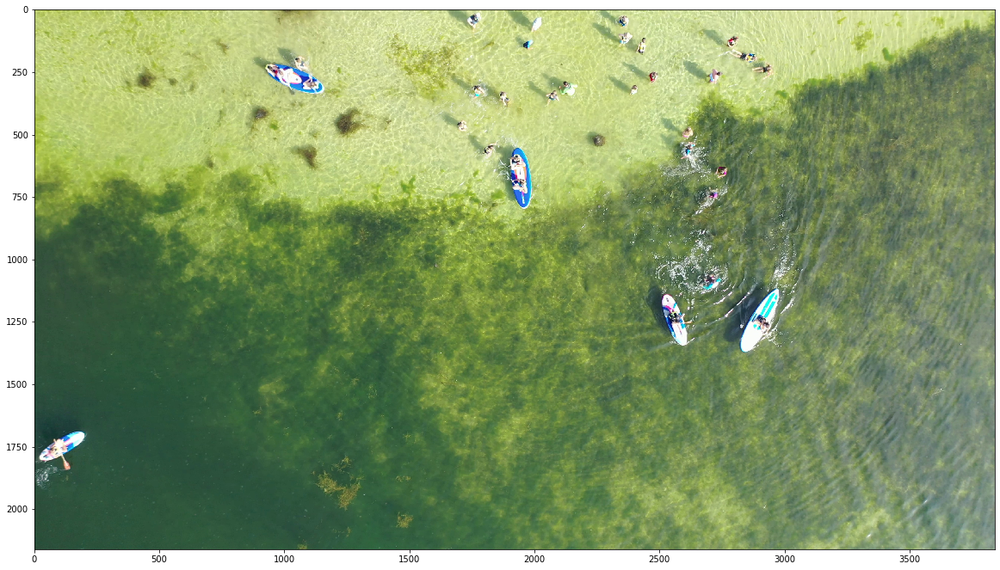

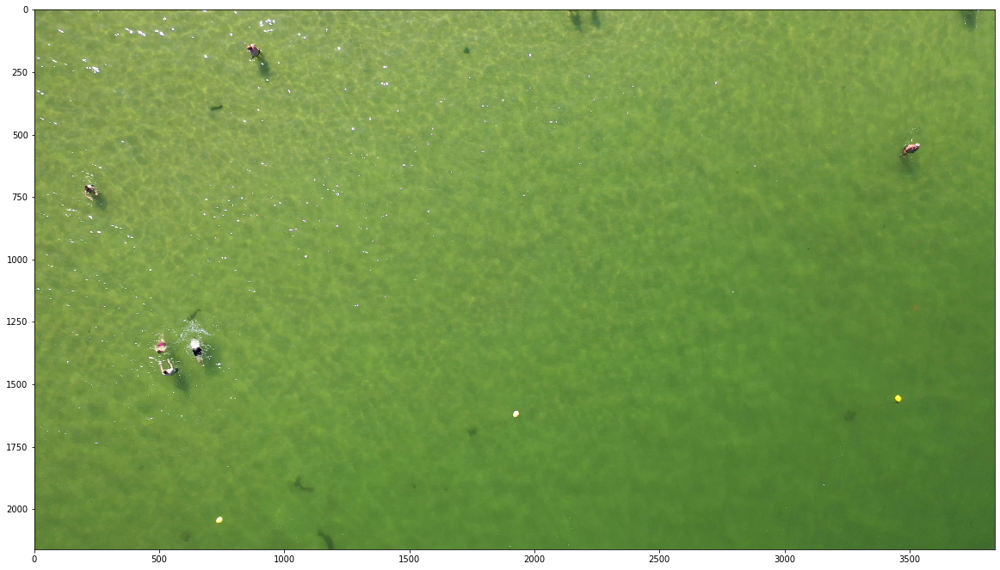

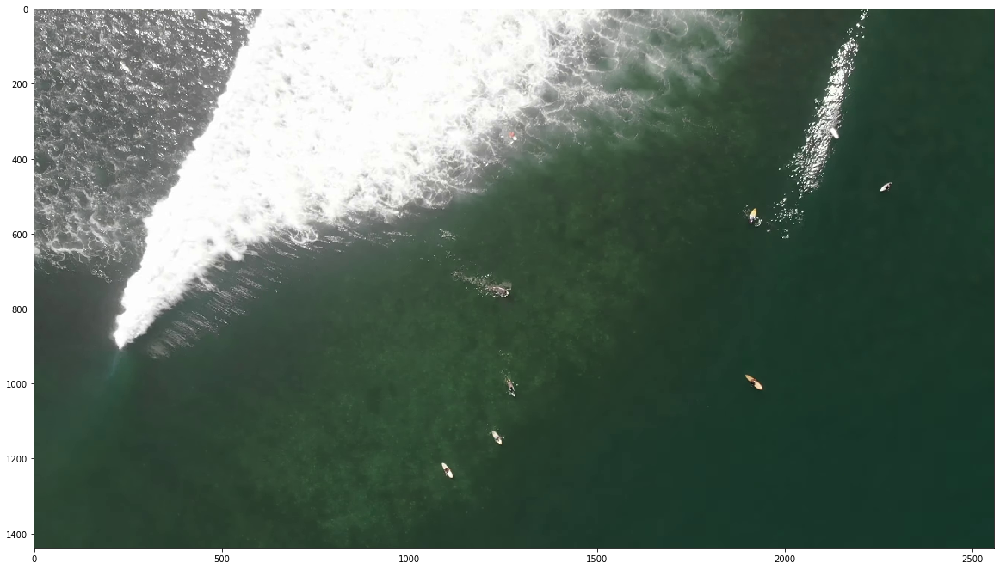

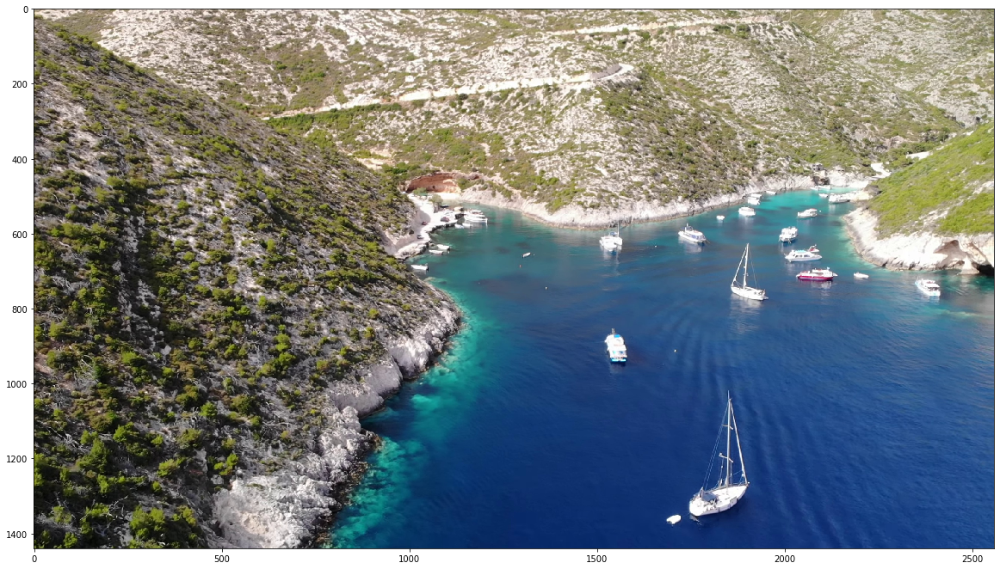

In [6]:
print_images(loaded_images)

In [7]:
def read_labels(dir_path):
    dets_files = [f for f in listdir(dir_path) if isfile(join(dir_path, f))]
    dets_files_content = []
    for file_name in dets_files:
        file = open(dir_path + '\\' + file_name, 'r') 
        dets_files_content.append(file.readlines())
    return dets_files_content

In [8]:
gt_files_content = read_labels(TEST_GT_PATH)
yolo_files_content = read_labels(TEST_YOLO_DETS_PATH)

In [9]:
def draw_text_with_background(image, text, color, coords, h=50):
    x, y = coords[0], coords[1]
    w = len(text) * 18
    # Draw black background rectangle
    cv2.rectangle(image, (x, y), (x + w, y - h), (0,0,0), -1)
    # Add text
    cv2.putText(image, text, (x + int(w/18),y - int(h/3)), cv2.FONT_HERSHEY_SIMPLEX, 1, color, 4)

In [10]:
def bb_iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    # Compute the area of intersection rectangle
    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
    # Compute the area of both the prediction and ground-truth
    boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
    boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
    # Compute the intersection over union
    iou = interArea / float(boxAArea + boxBArea - interArea)
    return iou

In [11]:
def cacl_iou(det_box, gts, width, height):
    ious = []
    for gt in gts:
        gt = gt.split()
        top_left = (int((float(gt[1]) - float(gt[3])/2) * width), int((float(gt[2]) - float(gt[4])/2) * height))
        bottom_right = (int((float(gt[1]) + float(gt[3])/2) * width), int((float(gt[2]) + float(gt[4])/2) * height))
        gt_box = [top_left[0],top_left[1],bottom_right[0],bottom_right[1]]
        iou = bb_iou(det_box, gt_box)
        if iou > 0:
            ious.append(iou)
    return ious

In [12]:
def plot_gt_pxywh(img, dets, color, thickness):
    for det in dets:
        det = det.split()
        width, height = img['w'], img['h']
        top_left = (int((float(det[1]) - float(det[3])/2) * width), int((float(det[2]) - float(det[4])/2) * height))
        bottom_right = (int((float(det[1]) + float(det[3])/2) * width), int((float(det[2]) + float(det[4])/2) * height))
        img['img'] = cv2.rectangle(img['img'], top_left, bottom_right, color, thickness)
    return img

def plot_dets_xywh(img, dets, thickness, colors=[], conf_thresh = 0, iou_calc = False, gts = []):
    if len(colors) == 0:
        for x in range(len(classes_dict)):
            colors.append((randint(0, 255),randint(0, 255),randint(0, 255)))
    for det in dets:
        det = det.split()
        if float(det[1]) >= conf_thresh:
            top_left = (int((float(det[2]) - float(det[4])/2)), int((float(det[3]) - float(det[5])/2)))
            bottom_right = (int((float(det[2]) + float(det[4])/2)), int((float(det[3]) + float(det[5])/2)))
            img['img'] = cv2.rectangle(img['img'], top_left, bottom_right, colors[int(det[0])], thickness)
            obj_label = classes_dict[int(det[0])] + ' ' + det[1]
            if iou_calc:
                ious = cacl_iou([top_left[0],top_left[1],bottom_right[0],bottom_right[1]], gts, img['w'], img['h'])
                max_iou = 0
                if len(ious) > 0:
                    max_iou = max(ious)
                len_ious = len(ious)
                obj_label = classes_dict[int(det[0])] + ' ' + det[1] + ' IoU=' + str(round(max_iou,2)) + ' (' + str(len_ious) + ') '
                draw_text_with_background(img['img'], obj_label, colors[int(det[0])], top_left)
            else:
                draw_text_with_background(img['img'], obj_label, colors[int(det[0])], top_left)
    return img

In [13]:
for nr in range(len(loaded_images)):
    loaded_images[nr] = plot_gt_pxywh(loaded_images[nr], gt_files_content[nr], (53, 252, 23), 5)
    loaded_images[nr] = plot_dets_xywh(loaded_images[nr], yolo_files_content[nr], 5, [(255, 221, 0), (189, 46, 255)], 0.25, True,gt_files_content[nr])

In [14]:
def save_images(path, images):
    for nr in range(len(images)):
        cv2.imwrite(path + '//' + images[nr]['name'], cv2.cvtColor(images[nr]['img'], cv2.COLOR_RGB2BGR)) 

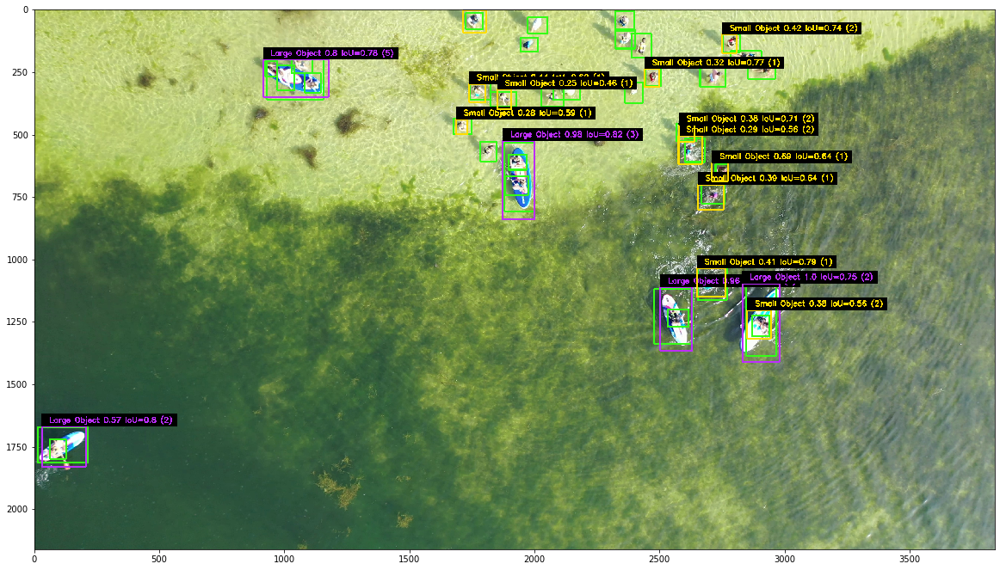

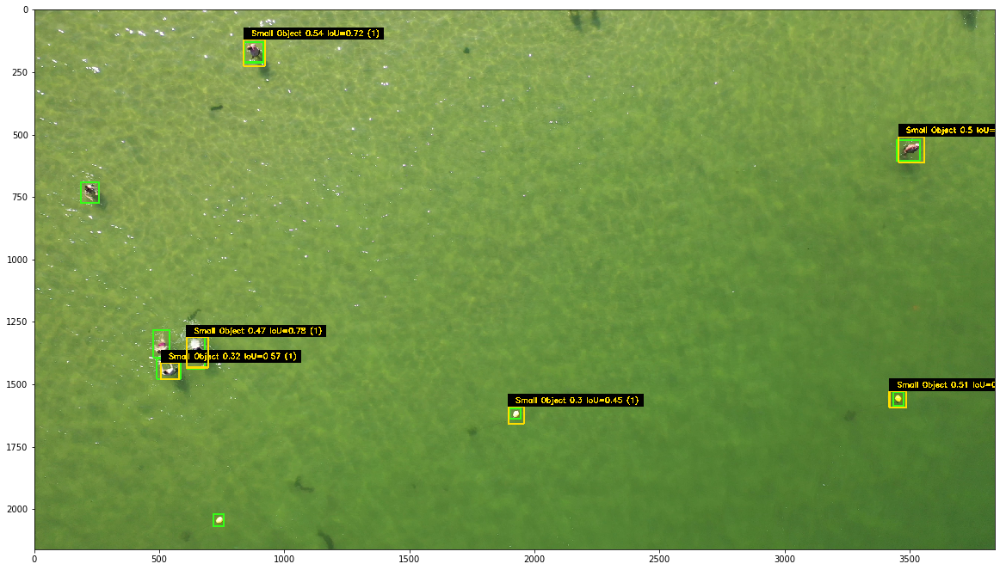

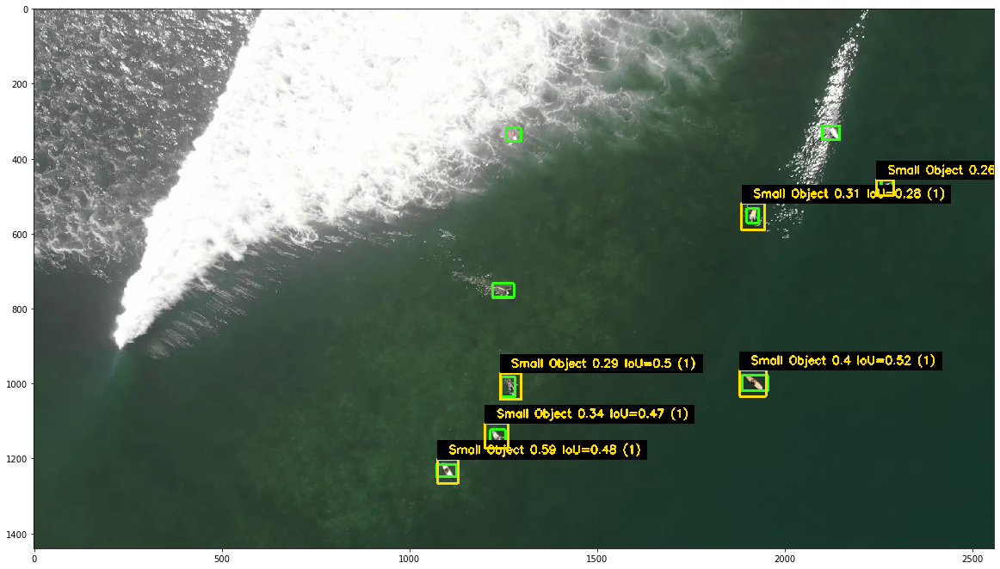

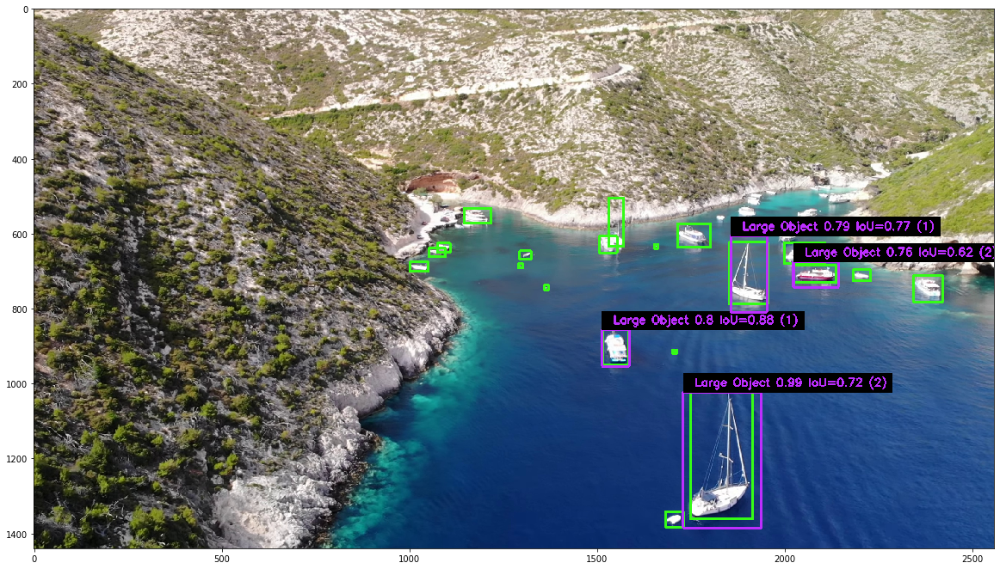

In [15]:
print_images(loaded_images)
save_images(TEST_RESULTS_PATH, loaded_images)

In [16]:
loaded_images2 = load_images(TEST_IMAGES_PATH)

In [17]:
# The COCO bounding box format is [top left x position, top left y position, width, height].

In [199]:
class DetVis:
    
    def __init__(self):
        self.orginal_images = []
        self.images = []
        self.labels = {}
        
    def __draw_text_with_background(self, image, text, color, coords, h=50):
        x, y = coords[0], coords[1]
        w = len(text) * 18
        # Draw black background rectangle
        cv2.rectangle(image, (x, y), (x + w, y - h), (0,0,0), -1)
        # Add text
        cv2.putText(image, text, (x + int(w/18),y - int(h/3)), cv2.FONT_HERSHEY_SIMPLEX, 1, color, 4)
        
    def __draw_legend_element(self, image, coords, size, class_name, color):
        x, y = coords[0], coords[1]
        print(image, (x, y), (x + size*0.5, y - size*0.5), color, -1)
        cv2.rectangle(image, (x, y), (int(x + size*2), int(y - size*2)), color, -1)
        cv2.putText(image, str(class_name), (int(x + size*3), int(y - size)), cv2.FONT_HERSHEY_SIMPLEX, 1, color, 4)
        
    def load_images(self, dir_path):
        images_files = [f for f in listdir(dir_path) if isfile(join(dir_path, f))]
        for file_name in images_files:
            image_data = {}
            image_data['img'] = cv2.cvtColor(cv2.imread(dir_path + '/' + file_name,cv2.COLOR_BGR2RGB),cv2.COLOR_BGR2RGB)
            image_data['h'] = image_data['img'].shape[0]
            image_data['w'] = image_data['img'].shape[1]
            image_data['name'] = file_name.split('.')[0]
            self.images.append(image_data)
            self.orginal_images.append(image_data)
            
    def load_detections(self, dir_path, detections_format, detections_name):
        single_labels = {}
        single_labels["name"] = detections_name
        # W sumie formatu użył bym tylko do przeskonwertowania na xywh
        single_labels["format"] = detections_format
        labels_files = [f for f in listdir(dir_path) if isfile(join(dir_path, f))]
        labels_files_content = {}
        for file_name in labels_files:
            file = open(dir_path + '\\' + file_name, 'r')
            labels_files_content[file_name.split('.')[0]] = file.readlines()
        single_labels["detections"] = labels_files_content
        self.labels[detections_name] = single_labels
        
    def load_gt(self, dir_path, gt_format):
        self.load_detections(dir_path, gt_format, "GT")
    
    def plot_detections(self, detections_name, thickness, colors=[], conf_thresh = 0, iou_calc = False, legend=True):
        if len(colors) == 0:
            for x in range(len(classes_dict)):
                colors.append((randint(0, 255),randint(0, 255),randint(0, 255)))
        if iou_calc:
            gts = self.labels['GT']['detections']
        for i, img in enumerate(self.images):
            for det in self.labels[detections_name]['detections'][img['name']]:
                det = det.split()
                if float(det[1]) >= conf_thresh:
                    top_left = (int((float(det[2]) - float(det[4])/2)), int((float(det[3]) - float(det[5])/2)))
                    bottom_right = (int((float(det[2]) + float(det[4])/2)), int((float(det[3]) + float(det[5])/2)))
                    img['img'] = cv2.rectangle(img['img'], top_left, bottom_right, colors[int(det[0])], thickness)
                    obj_label = classes_dict[int(det[0])] + ' ' + det[1]
                    if iou_calc:
                        ious = cacl_iou([top_left[0],top_left[1],bottom_right[0],bottom_right[1]], gts[img['name']], img['w'], img['h'])
                        max_iou = 0
                        if len(ious) > 0:
                            max_iou = max(ious)
                        len_ious = len(ious)
                        obj_label = classes_dict[int(det[0])] + ' ' + det[1] + ' IoU=' + str(round(max_iou,2)) + ' (' + str(len_ious) + ') '
                        self.__draw_text_with_background(img['img'], obj_label, colors[int(det[0])], top_left)
                    else:
                        self.__draw_text_with_background(img['img'], obj_label, colors[int(det[0])], top_left)
            if legend:
                self.plot_legend(img)
            self.images[i] = img
    
    def plot_gt(self, color, thickness):
        for i, img in enumerate(self.images):
            for det in self.labels['GT']['detections'][img['name']]:
                det = det.split()
                width, height = img['w'], img['h']
                top_left = (int((float(det[1]) - float(det[3])/2) * width), int((float(det[2]) - float(det[4])/2) * height))
                bottom_right = (int((float(det[1]) + float(det[3])/2) * width), int((float(det[2]) + float(det[4])/2) * height))
                img['img'] = cv2.rectangle(img['img'], top_left, bottom_right, color, thickness)
            self.images[i] = img
            
    def plot_legend(self, img):
        img_width, img_height = img['w'], img['h']
        # Find longest name in class names
        w = 0.18*img_width #len(sorted(classes_dict.values(), key=len)[-1]) * 18 + 180
        h = 0.05*img_height * len(classes_dict)#50 * len(classes_dict)
        #print(img['img'], (0.8*img_width, 0.8*img_height), (0.8*img_width + w, 0.8*img_height - h), (0,0,0), -1)
        cv2.rectangle(img['img'], (int(0.8*img_width), int(0.05*img_height)), (int(0.8*img_width + w), int(0.05*img_height + h)), (0,0,0), -1)
        i = 1
        for class_name in classes_dict.items():
            self.__draw_legend_element(img['img'], (int(0.8*img_width+0.01*img_width), int(0.05*img_height + 0.03*img_height * i)), 0.01*img_height, class_name[1],(255, 221, 0))
            i =+ 2
#     def calc_image_statistics():
#         for i, img in enumerate(self.images):
#             for det in self.labels[detections_name]['detections'][img['name']]:
                
    def clear_images(self):
        self.images = self.orginal_images
        
    def print_images(self):
        for image in self.images:
            plt.figure(figsize=(20,20))
            plt.imshow(image['img'])
            
    def save_images(self, path, surfix):
        for image in self.images:
            cv2.imwrite(path + '//' + image['name'] + surfix + '.jpg', cv2.cvtColor(image['img'], cv2.COLOR_RGB2BGR)) 

In [200]:
detVis = DetVis()

In [201]:
detVis.load_images(TEST_IMAGES_PATH)

In [202]:
detVis.load_detections(TEST_YOLO_DETS_PATH, "xywh", "YOLO")

In [203]:
detVis.load_gt(TEST_GT_PATH, "xywh")

In [204]:
detVis.plot_gt((53, 252, 23), 8)

In [205]:
detVis.plot_detections("YOLO", 2, [(255, 221, 0), (189, 46, 255)], 0.25)

[[[185 203 103]
  [184 202 102]
  [183 201 101]
  ...
  [206 221 140]
  [207 222 141]
  [208 223 142]]

 [[188 206 106]
  [188 206 106]
  [187 205 105]
  ...
  [206 221 140]
  [207 222 141]
  [207 222 141]]

 [[194 212 113]
  [193 211 112]
  [193 211 112]
  ...
  [205 219 140]
  [206 220 141]
  [206 220 141]]

 ...

 [[ 41  74  55]
  [ 40  73  54]
  [ 40  73  54]
  ...
  [143 164 145]
  [143 164 145]
  [143 164 145]]

 [[ 42  73  55]
  [ 41  72  54]
  [ 40  73  54]
  ...
  [143 164 145]
  [144 165 146]
  [144 165 146]]

 [[ 41  72  54]
  [ 40  71  53]
  [ 40  73  54]
  ...
  [144 165 146]
  [144 165 146]
  [145 166 147]]] (3110, 172) (3120.8, 161.2) (255, 221, 0) -1
[[[185 203 103]
  [184 202 102]
  [183 201 101]
  ...
  [206 221 140]
  [207 222 141]
  [208 223 142]]

 [[188 206 106]
  [188 206 106]
  [187 205 105]
  ...
  [206 221 140]
  [207 222 141]
  [207 222 141]]

 [[194 212 113]
  [193 211 112]
  [193 211 112]
  ...
  [205 219 140]
  [206 220 141]
  [206 220 141]]

 ...

 [[ 41 

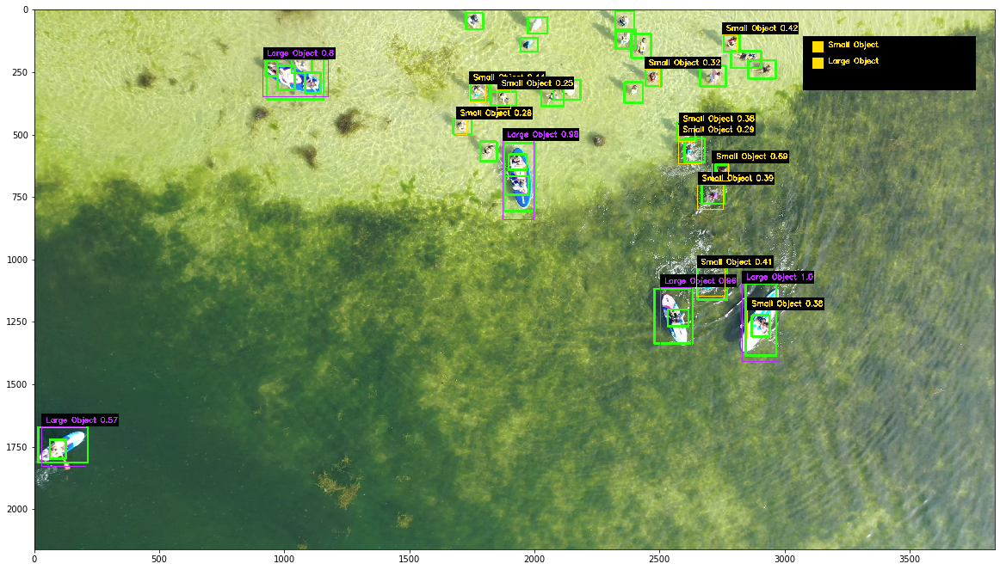

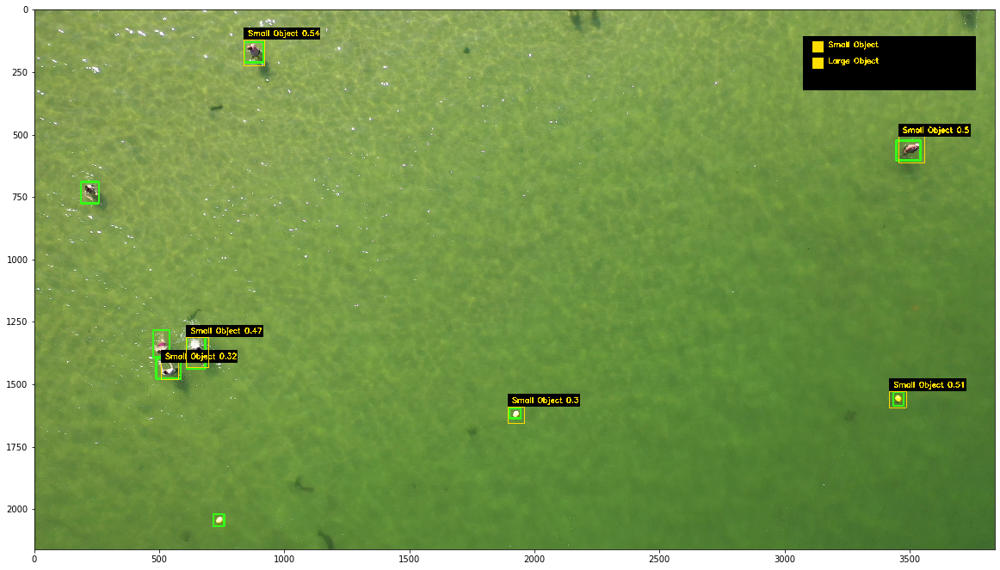

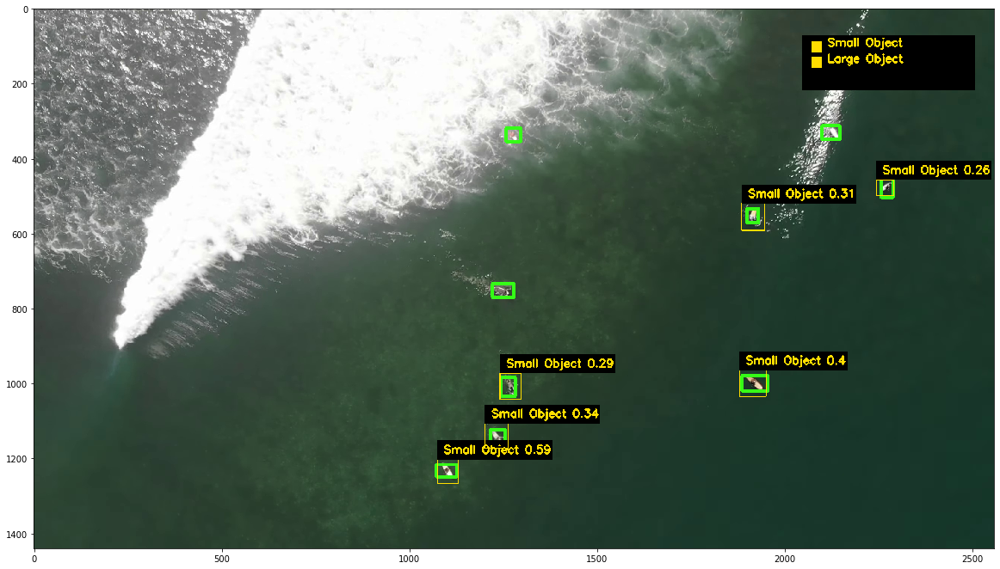

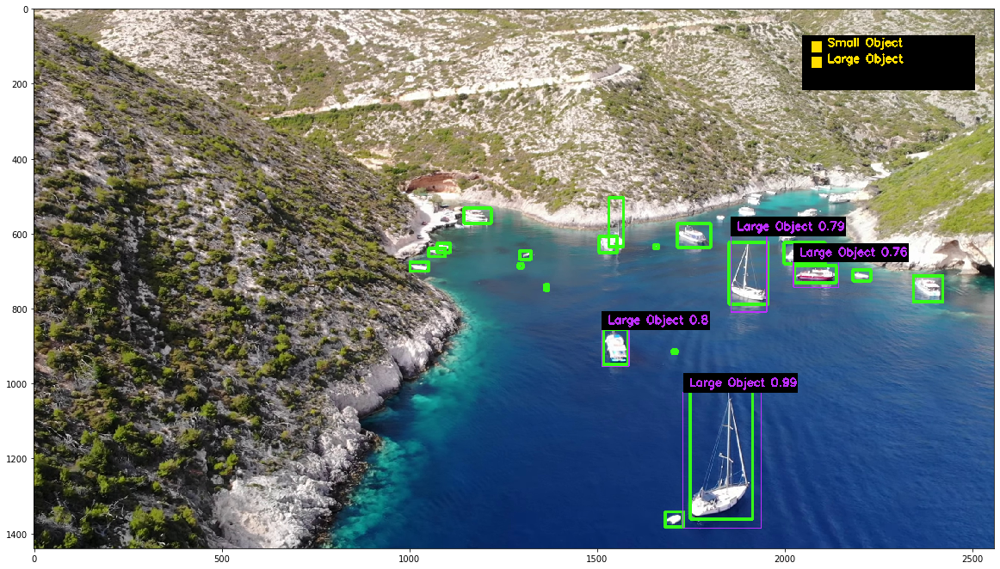

In [206]:
detVis.print_images()

In [130]:
detVis.clear_images()
detVis.plot_gt((53, 252, 23), 8)
detVis.plot_detections("YOLO", 2, [(255, 221, 0), (189, 46, 255)], 0.25, True)

[[[185 203 103]
  [184 202 102]
  [183 201 101]
  ...
  [206 221 140]
  [207 222 141]
  [208 223 142]]

 [[188 206 106]
  [188 206 106]
  [187 205 105]
  ...
  [206 221 140]
  [207 222 141]
  [207 222 141]]

 [[194 212 113]
  [193 211 112]
  [193 211 112]
  ...
  [205 219 140]
  [206 220 141]
  [206 220 141]]

 ...

 [[ 41  74  55]
  [ 40  73  54]
  [ 40  73  54]
  ...
  [143 164 145]
  [143 164 145]
  [143 164 145]]

 [[ 42  73  55]
  [ 41  72  54]
  [ 40  73  54]
  ...
  [143 164 145]
  [144 165 146]
  [144 165 146]]

 [[ 41  72  54]
  [ 40  71  53]
  [ 40  73  54]
  ...
  [144 165 146]
  [144 165 146]
  [145 166 147]]] (3110, 1620) (3114.0, 1616.0) (255, 221, 0) -1
[[[185 203 103]
  [184 202 102]
  [183 201 101]
  ...
  [206 221 140]
  [207 222 141]
  [208 223 142]]

 [[188 206 106]
  [188 206 106]
  [187 205 105]
  ...
  [206 221 140]
  [207 222 141]
  [207 222 141]]

 [[194 212 113]
  [193 211 112]
  [193 211 112]
  ...
  [205 219 140]
  [206 220 141]
  [206 220 141]]

 ...

 [[ 4

In [ ]:
detVis.print_images()

In [ ]:
detVis.save_images(TEST_RESULTS_PATH, "_iou")